## 1 . About Dataset
**Subtitle:** "Mapping Satellite Images: A Comprehensive Dataset"

**About Dataset:**

This dataset is designed for the task of mapping satellite images to corresponding map representations using advanced techniques like pix2pix GANs. It is structured to facilitate training and validation for machine learning models, providing a robust foundation for image-to-image translation projects.

### Dataset Structure
- **Main Directory:** `maps`
  - **Train Folder:** Contains 1096 training images
  - **Val Folder:** Contains 1098 validation images

### Image Details
- **Dimensions:** Each image is 1200x600 pixels (width x height)
- **Content:**
  - The left half (600x600 pixels) is the satellite image
  - The right half (600x600 pixels) is the corresponding map image, serving as the target for the satellite image

### Usage
This dataset is ideal for developing and testing models that perform image translation from satellite photos to map images, supporting various applications in remote sensing, urban planning, and geographic information systems (GIS).

<img src ="https://miro.medium.com/v2/resize:fit:1100/format:webp/1*qr4VC4ZfTZn2jMlVIditgQ.jpeg">

In [1]:
import numpy as np 
import pandas as pd  
from PIL import Image  
import matplotlib  
import matplotlib.pyplot as plt  
import torch  
from torch import nn 
from torch import optim  
import torch.optim as optim  
import torch.nn.functional as F 
from torchvision import transforms, models 
from tqdm.notebook import tqdm
from torch.autograd import Variable  
from torchvision.datasets import ImageFolder 
import torch.utils.data as data 
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.transforms import v2
from torch.utils.data import DataLoader, TensorDataset  , Dataset
import os

### 1.1 Device Data Loader for PyTorch

This code snippet offers utilities for seamless data movement between CPU and GPU devices using PyTorch. `get_default_device()` selects a GPU if available, falling back to CPU otherwise. `to_device(data, device)` efficiently moves tensors to the specified device, handling both individual tensors and collections. The `DeviceDataLoader` class wraps a PyTorch DataLoader, ensuring data batches are transferred to the designated device upon iteration. This setup enhances performance and flexibility when working with large datasets and varying hardware configurations. Usage involves initializing a DataLoader, obtaining the target device, and wrapping the DataLoader with `DeviceDataLoader` for seamless device handling during data processing. This concise utility simplifies the management of device resources in PyTorch workflows.

In [2]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)
    
device = get_default_device()
device

device(type='cuda')

## 2 . Data Augmentation/Cleaning and Image Folder
We can create training and validation datasets using the `Dataset` class from `torchvision`. In addition to the `ToTensor` transform, we'll also apply some other transforms to the images. There are a few important changes we'll make while creating PyTorch datasets for training and validation:

In [3]:
class Pix2PixDataset(Dataset):
    def __init__(self, root_dir:str, split_size:int = 600 ,transform : transforms.Compose =None):
        self.split_size = split_size
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith('.jpg') or fname.endswith('.png')]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        
        input_image = image.crop((0, 0, self.split_size, self.split_size))  
        target_image = image.crop((self.split_size, 0, self.split_size*2, self.split_size)) 
        
        if self.transform:
            input_image = self.transform(input_image)
            target_image = self.transform(target_image)

        return input_image, target_image

In [4]:
!pip install opendatasets --q

In [5]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/skjha69/map-dataset")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  skjha69


Your Kaggle Key:

  ································


Dataset URL: https://www.kaggle.com/datasets/skjha69/map-dataset


100%|██████████| 239M/239M [00:02<00:00, 114MB/s]  


In [6]:
data_dir = "/kaggle/working/map-dataset/maps/"
os.listdir(data_dir)

['train', 'val']

In [7]:
train_dir = data_dir + "train/"
val_dir = data_dir + "val/"

In [8]:
IMG_SIZE = 512
image_transforms = transforms.Compose([
    v2.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.ToTensor(),
])

train_dataset = Pix2PixDataset(root_dir=train_dir, 
                               transform=image_transforms , 
                               split_size = 600)

val_dataset = Pix2PixDataset(root_dir=val_dir, 
                             transform=image_transforms , 
                             split_size = 600)

### 2.1 Visualizing  data

In [9]:
len(train_dataset) ,len(val_dataset)

(1096, 1098)

In [10]:
image, target = train_dataset[0]

In [11]:
image.shape , target.shape

(torch.Size([3, 512, 512]), torch.Size([3, 512, 512]))

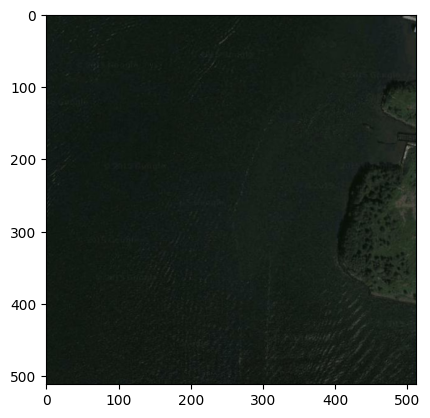

In [12]:
plt.imshow(image.permute(1,2,0))

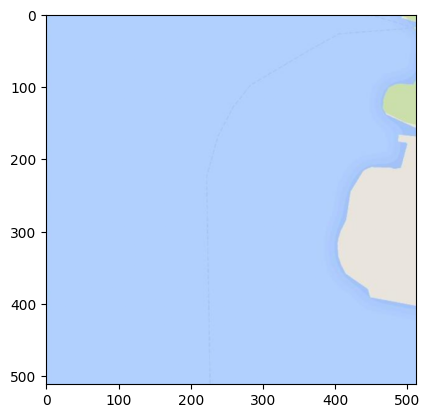

In [13]:
plt.imshow(target.permute(1,2,0))

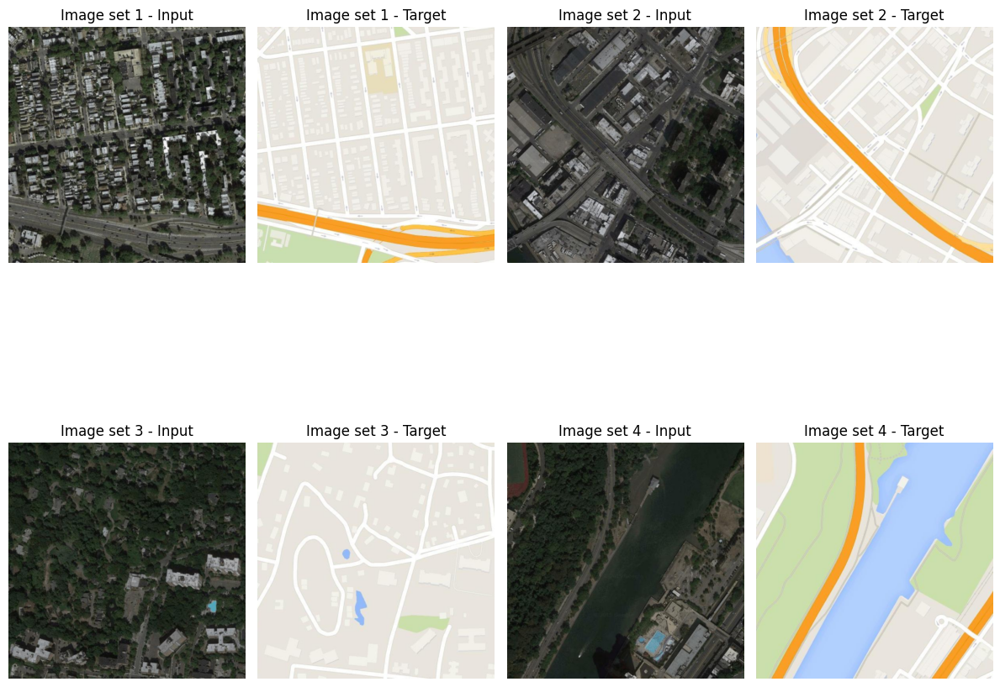

In [14]:
import random
import torch
import matplotlib.pyplot as plt

def plot_random_images(dataset: torch.utils.data.Dataset, n: int = 3, seed: int = None) -> None:
    """
    Plots a grid of n x n pairs of random images and their corresponding target images from the dataset.
    
    Args:
        dataset (torch.utils.data.Dataset): The dataset from which to draw the images.
        n (int, optional): The size of the grid (number of rows and columns). Default is 3.
        seed (int, optional): Random seed for reproducibility. Default is None.
    """
    if seed:
        random.seed(seed)

    fig, axes = plt.subplots(n, n*2, figsize=(12, 12))
    
    for i in range(n):
        for j in range(n):
            random_idx = torch.randint(0, len(dataset), size=[1]).item()
            input_image, target_image = dataset[random_idx]
            
            ax_input = axes[i, j*2]
            ax_target = axes[i, j*2 + 1]
            
            ax_input.imshow(input_image.permute(1, 2, 0))
            ax_input.set_title(f'Image set {i*n + j + 1} - Input')
            ax_input.axis('off')
            
            ax_target.imshow(target_image.permute(1, 2, 0))
            ax_target.set_title(f'Image set {i*n + j + 1} - Target')
            ax_target.axis('off')
    
    plt.tight_layout()
    plt.show()

plot_random_images(dataset = train_dataset, n = 2 )

### 2.2 Creating Dataloaders

In [15]:
BATCH_SIZE = 8
NUM_WORKERS = os.cpu_count()

train_loader = DataLoader(
    dataset = train_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True,
    num_workers = NUM_WORKERS,
)

val_loader = DataLoader(
    dataset = val_dataset,
    batch_size = BATCH_SIZE,
    num_workers = NUM_WORKERS,
)

In [16]:
len(train_loader),len(val_loader)

(137, 138)

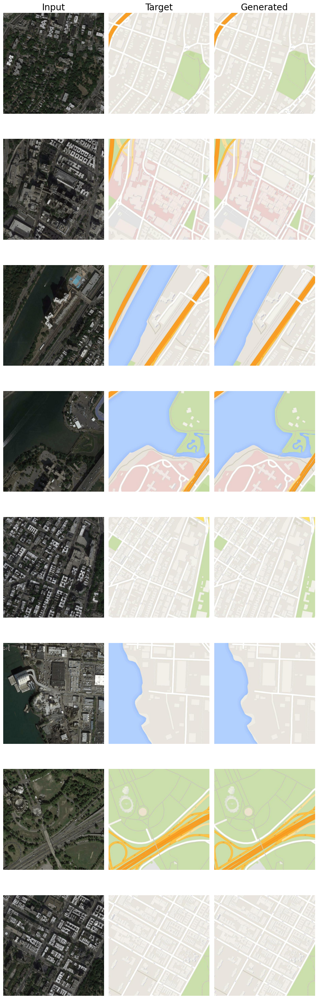

In [17]:
import matplotlib.pyplot as plt
import torch

def plot_image_grid(input_images: torch.Tensor, target_images: torch.Tensor, generated_images: torch.Tensor = None, nmax: int = None) -> None:
    """
    Display a grid of input, target, and optionally generated images in a 1x3 format for each set.

    Parameters:
    input_images (torch.Tensor): A batch of input images of shape (batch_size, 3, 256, 256).
    target_images (torch.Tensor): A batch of target images of shape (batch_size, 3, 256, 256).
    generated_images (torch.Tensor, optional): A batch of generated images of shape (batch_size, 3, 256, 256). Defaults to None.
    nmax (int, optional): Maximum number of images to display. If None, display all images in the batch. Defaults to None.

    Returns:
    None: This function does not return any value. It displays a grid of images.
    """
    if nmax is not None:
        input_images = input_images[:nmax]
        target_images = target_images[:nmax]
        if generated_images is not None:
            generated_images = generated_images[:nmax]

    num_images = input_images.shape[0]
    ncols = 3 if generated_images is not None else 2

    fig, axes = plt.subplots(num_images, ncols, figsize=(10, 4 * num_images))

    # Set column titles
    col_titles = ['Input', 'Target']
    if generated_images is not None:
        col_titles.append('Generated')
    
    for ax, title in zip(axes[0], col_titles):
        ax.set_title(title, fontsize=20)

    # Plot images
    for i in range(num_images):
        axes[i, 0].imshow(input_images[i].permute(1, 2, 0))
        axes[i, 0].axis('off')

        axes[i, 1].imshow(target_images[i].permute(1, 2, 0))
        axes[i, 1].axis('off')

        if generated_images is not None:
            axes[i, 2].imshow(generated_images[i].permute(1, 2, 0))
            axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


generated_images = torch.randn([4,3,256,256])
def show_batch(dataloader: torch.utils.data.DataLoader, 
               plot_image_grid: callable, 
               nmax: int = 4) -> None:
    """
    Display a batch of images from a DataLoader using a specified function to create an image grid.

    Parameters:
    dataloader (torch.utils.data.DataLoader): The DataLoader to fetch the batch of images from.
    plot_image_grid (callable): The function used to create and display the image grid.
    nmax (int, optional): The maximum number of images to display. Defaults to 64.

    Returns:
    None: This function does not return any value. It displays a batch of images using the provided image grid function.
    """
    for images, targets in dataloader:
        plot_image_grid(images.cpu(),targets.cpu(),targets.cpu())
        break
show_batch(train_loader , plot_image_grid)

## 3. Generator and Discriminator | Pix2Pix GAN
### Pix2Pix GAN Architecture: Transforming Satellite Images to Maps

### Overview
Pix2Pix GAN is a conditional Generative Adversarial Network (cGAN) designed for image-to-image translation tasks. The network consists of two main components:
- **Generator (U-Net Architecture)**
- **Discriminator (PatchGAN Architecture)**

### Key Points
- **Conditional GAN**: Pix2Pix GANs generate images based on specific input conditions, ensuring the generated output is closely related to the input image.
- **Image-to-Image Translation**: The architecture is highly effective for tasks like transforming satellite images into corresponding map images.

### Generator: U-Net Architecture

The generator in Pix2Pix GAN follows a U-Net architecture, which includes an encoder-decoder structure with skip connections. This design helps in retaining high-resolution details in the generated images.

#### Encoder (Contracting Path)
- **Input Layer**: 3x3 Convolution + Batch Normalization + ReLU (LeakyReLU for down-sampling)
- **Down-sampling**: Series of convolutional layers with stride 2
- **Skip Connections**: Direct connections between encoder and decoder layers to retain spatial information

#### Layers
1. **Conv1**: 64 filters, 4x4 kernel, stride 2 (LeakyReLU)
2. **Conv2**: 128 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
3. **Conv3**: 256 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
4. **Conv4**: 512 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
5. **Conv5**: 512 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
6. **Conv6**: 512 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
7. **Conv7**: 512 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
8. **Conv8**: 512 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)

#### Decoder (Expanding Path)
- **Up-sampling**: Series of transposed convolutional layers with stride 2
- **Concatenate**: Skip connections from encoder layers

#### Layers
1. **Deconv1**: 512 filters, 4x4 kernel, stride 2 (Dropout + ReLU)
2. **Deconv2**: 512 filters, 4x4 kernel, stride 2 (Dropout + ReLU)
3. **Deconv3**: 512 filters, 4x4 kernel, stride 2 (Dropout + ReLU)
4. **Deconv4**: 512 filters, 4x4 kernel, stride 2 (BatchNorm + ReLU)
5. **Deconv5**: 256 filters, 4x4 kernel, stride 2 (BatchNorm + ReLU)
6. **Deconv6**: 128 filters, 4x4 kernel, stride 2 (BatchNorm + ReLU)
7. **Deconv7**: 64 filters, 4x4 kernel, stride 2 (BatchNorm + ReLU)
8. **Output Layer**: 3x3 Convolution + Tanh (to output the transformed image)

### Discriminator: PatchGAN Architecture

The discriminator in Pix2Pix GAN uses the PatchGAN approach, which classifies each N x N patch in the image as real or fake. This method effectively captures high-frequency details, making the model particularly suitable for image translation tasks.

#### Architecture
- **Input Layer**: Concatenation of input image and target image
- **Convolutional Layers**: Series of convolutional layers with stride 2

#### Layers
1. **Conv1**: 64 filters, 4x4 kernel, stride 2 (LeakyReLU)
2. **Conv2**: 128 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
3. **Conv3**: 256 filters, 4x4 kernel, stride 2 (BatchNorm + LeakyReLU)
4. **Conv4**: 512 filters, 4x4 kernel, stride 1 (BatchNorm + LeakyReLU)
5. **Output Layer**: 1 filter, 4x4 kernel, stride 1 (Sigmoid, outputs a map of probabilities)

### Innovative Points
- **Conditional Input**: Ensures output is contextually aligned with the input image.
- **U-Net with Skip Connections**: Helps in retaining spatial information, leading to higher quality outputs.
- **PatchGAN Discriminator**: Focuses on high-frequency details, improving the realism of generated images.

### References
- **Original Paper**: [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/abs/1611.07004)
- **GitHub Implementation**: [Pix2Pix TensorFlow](https://github.com/affinelayer/pix2pix-tensorflow)


<img src = "https://blogger.googleusercontent.com/img/b/R29vZ2xl/AVvXsEiCmcxDY1Ro8Oh3j4AzINk4C7fPrLB2cUE3ZF95sXXFEI7y3iXEPxQHTbgI6JJWHGS27rzpVoFG_Mh0yN70kw6AYOnsxgUXQVSyghjnzJbTu75yyYU58jj88zc7pI2ahylPHWZgIV3TtNE/s806/Google+ChromeScreenSnapz096.jpg">

In [19]:
class DownConvLayer(nn.Module):
    def __init__(self , in_channels , out_channels):
        super(DownConvLayer, self).__init__()
        self.Layer = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels , kernel_size=4 , stride = 2 , padding = 1 , padding_mode="reflect" , bias = False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2 , inplace=True)
        )
    def forward(self , x):
        return self.Layer(x)

class UpConvLayer(nn.Module):
    def __init__(self , in_channels , out_channels , use_dropout = False):
        super(UpConvLayer, self).__init__()
        self.use_dropout = use_dropout
        self.Layer = nn.Sequential(
            nn.ConvTranspose2d(in_channels=in_channels, out_channels=out_channels , kernel_size=4 , stride = 2 , padding = 1, bias = False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
        self.Dropout = nn.Dropout(p = 0.5)
    def forward(self , x):
        x = self.Layer(x)
        return self.Dropout(x) if self.use_dropout else x


class Generator(nn.Module):
    def __init__(self, in_channels = 3):
        super(Generator,self).__init__()

        self.DownConvLayer1 = nn.Sequential(
            nn.Conv2d(in_channels=3,out_channels=64,kernel_size=4,stride=2,padding=1,padding_mode="reflect"),
            nn.LeakyReLU(0.2 , inplace=True),
        )

        self.DownConvLayer2 = DownConvLayer(in_channels=64 ,out_channels=128)
        self.DownConvLayer3 = DownConvLayer(in_channels=128 ,out_channels=256)
        self.DownConvLayer4 = DownConvLayer(in_channels=256 ,out_channels=512)
        self.DownConvLayer5 = DownConvLayer(in_channels=512 ,out_channels=512)
        self.DownConvLayer6 = DownConvLayer(in_channels=512 ,out_channels=512)
        self.DownConvLayer7 = DownConvLayer(in_channels=512 ,out_channels=512)

        self.BottleNeck = nn.Sequential(
            nn.Conv2d(in_channels=512 , out_channels= 512,kernel_size= 4, stride=2, padding=1), 
            nn.ReLU(inplace=True)
        )

        self.UpConvLayer1 = UpConvLayer(in_channels=512 , out_channels=512 ,use_dropout=True)
        self.UpConvLayer2 = UpConvLayer(in_channels=1024 , out_channels=512 ,use_dropout=True)
        self.UpConvLayer3 = UpConvLayer(in_channels=1024, out_channels=512 ,use_dropout=True)
        self.UpConvLayer4 = UpConvLayer(in_channels=1024 , out_channels=512 ,use_dropout=False)
        self.UpConvLayer5 = UpConvLayer(in_channels=1024 , out_channels=256 ,use_dropout=False)
        self.UpConvLayer6 = UpConvLayer(in_channels=512 , out_channels=128 ,use_dropout=False)
        self.UpConvLayer7 = UpConvLayer(in_channels=256 , out_channels=64 ,use_dropout=False)

        self.FinalConvLayer = nn.Sequential(
            nn.ConvTranspose2d(in_channels=128, out_channels=in_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self,x):
        down1 = self.DownConvLayer1(x)
        down2 = self.DownConvLayer2(down1)
        down3 = self.DownConvLayer3(down2)
        down4 = self.DownConvLayer4(down3)
        down5 = self.DownConvLayer5(down4)
        down6 = self.DownConvLayer6(down5)
        down7 = self.DownConvLayer7(down6)
        bottleneck = self.BottleNeck(down7)
        up1 = self.UpConvLayer1(bottleneck)
        up2 = self.UpConvLayer2(torch.cat([up1 ,down7],dim=1))
        up3 = self.UpConvLayer3(torch.cat([up2 ,down6],dim=1))
        up4 = self.UpConvLayer4(torch.cat([up3 ,down5],dim=1))
        up5 = self.UpConvLayer5(torch.cat([up4 ,down4],dim=1))
        up6 = self.UpConvLayer6(torch.cat([up5 ,down3],dim=1))
        up7 = self.UpConvLayer7(torch.cat([up6 ,down2],dim=1))
        return self.FinalConvLayer(torch.cat([up7 ,down1],dim=1))

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=2):
        super(ConvBlock,self).__init__()
        self.Layer = nn.Sequential(
            nn.Conv2d(in_channels=in_channels,out_channels=out_channels,kernel_size=4,stride=stride,padding=1,padding_mode='reflect',bias = False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2 , inplace=True),
        )
    def forward(self, x ):
        return self.Layer(x)
    
class Discriminator(nn.Module):
    def __init__(self , in_channels = 3):
        super(Discriminator,self).__init__()

        self.ConvLayer1 = nn.Sequential(
            nn.Conv2d(in_channels=in_channels*2 , out_channels=64 , kernel_size=4 , stride=2 , padding=1 , padding_mode='reflect'),
            nn.ReLU(inplace=True),
        )
        self.ConvLayer2 = ConvBlock(in_channels=64 , out_channels=128)
        self.ConvLayer3 = ConvBlock(in_channels=128 , out_channels=256)
        self.ConvLayer4 = ConvBlock(in_channels=256 , out_channels=512 , stride=1)
        self.ConvLayer5 = nn.Sequential(
            nn.Conv2d(in_channels=512 , out_channels=1 , kernel_size=4 , stride=1 , padding=1 , padding_mode="reflect")
        )

    def forward(self, x, y):
        x = torch.cat([x ,y], dim=1)
        x = self.ConvLayer1(x)
        x = self.ConvLayer2(x)
        x = self.ConvLayer3(x)
        x = self.ConvLayer4(x)
        x = self.ConvLayer5(x)
        return x

In [20]:
generator = Generator()
discriminator = Discriminator()
discriminator = to_device(discriminator, device)
generator = to_device(generator, device)

In [21]:
train_loader = DeviceDataLoader(train_loader, device)
val_loader = DeviceDataLoader(val_loader, device)

## 4. Image Grid Creation and Saving Functions

### `make_image_grid`

The `make_image_grid` function is designed to create a grid of images by concatenating input, target, and generated images into a single tensor. This grid tensor is structured to facilitate visual comparison and evaluation of model outputs.

#### Parameters:
- **input_images (torch.Tensor)**: Batch of input images.
- **target_images (torch.Tensor)**: Batch of target images (ground truth).
- **generated_images (torch.Tensor)**: Batch of generated images by the model.
- **nmax (int, optional)**: Maximum number of images to include in the grid. If provided, limits the number of images displayed. Defaults to None.

#### Returns:
- **torch.Tensor**: A tensor representing the concatenated image grid.

#### Explanation:
- The function concatenates the three sets of images along the height dimension to form a grid.
- It is useful for visualizing the relationship between input images, their corresponding targets, and the model's generated outputs.

### `save_image_grid`

The `save_image_grid` function saves a grid of input, target, and generated images to a specified directory. It uses the `make_image_grid` function to create the image grid before saving it as a PNG file.

#### Parameters:
- **index (int)**: Index used in the filename for saving the image grid.
- **input_images (torch.Tensor)**: Batch of input images.
- **target_images (torch.Tensor)**: Batch of target images (ground truth).
- **generated_images (torch.Tensor)**: Batch of generated images by the model.
- **make_image_grid (callable)**: Function that creates the image grid.
- **evaluation_dir (str)**: Directory path where the image grid will be saved.

#### Returns:
- **None**

- This function first converts the input, target, and generated images to CPU tensors.
- It then calls `make_image_grid` to generate a concatenated grid of images.
- Finally, it saves the grid as a PNG file in the specified `evaluation_dir`, with a filename formatted to include the `index`.

These functions are essential for visualizing and saving batches of images during model evaluation and can be integrated into pipelines for monitoring and analyzing model performance in image-to-image translation tasks.

In [22]:
import os
import torch
from torchvision.utils import save_image

def make_image_grid(input_images: torch.Tensor,
                    target_images: torch.Tensor,
                    generated_images: torch.Tensor ,
                    nmax: int = None) -> torch.Tensor:
    """
    Create a grid of input, target, and generated images.

    This function concatenates input, target, and optionally generated images into a single tensor
    that represents a grid. Each set of images is concatenated along the height dimension, and the
    resulting grid tensor can be used for saving or displaying.

    Parameters:
    input_images (torch.Tensor): A batch of input images with shape (batch_size, channels, height, width).
    target_images (torch.Tensor): A batch of target images with shape (batch_size, channels, height, width).
    generated_images (torch.Tensor): A batch of generated images with shape (batch_size, channels, height, width).
    nmax (int, optional): Maximum number of images to include in the grid. If None, all images are included. Defaults to None.

    Returns:
    torch.Tensor: A tensor representing the image grid.
    """
    all_images = torch.cat((input_images, target_images, generated_images), dim=0)
    nrow = input_images.size(0)
    grid = torch.cat([all_images[i::nrow] for i in range(nrow)], dim=2)
    return grid

def save_image_grid(index: int, 
                    input_images:torch.Tensor,
                    target_images:torch.Tensor,
                    generated_images:torch.Tensor, 
                    make_image_grid:callable ,
                    evaluation_dir:str) -> None:
    """
    Save a grid of input, target, and generated images to a file.

    This function creates a directory for saving images, generates a grid of images using the
    specified `make_image_grid` function, and saves the resulting image grid to a file.

    Parameters:
    index (int): Index for the filename to save the image grid.
    input_images (torch.Tensor): A batch of input images with shape (batch_size, channels, height, width).
    target_images (torch.Tensor): A batch of target images with shape (batch_size, channels, height, width).
    generated_images (torch.Tensor): A batch of generated images with shape (batch_size, channels, height, width).
    make_image_grid (callable): Function to create the image grid.
    show (bool, optional): Flag to indicate whether to display the image grid after saving (not implemented). Defaults to True.

    Returns:
    None: This function does not return any value. It saves the image grid to a file.
    """
    image_fname = 'generated-images-{0:0=4d}.png'.format(index)
    input_images = input_images.cpu()
    target_images = target_images.cpu()
    generated_images = generated_images.cpu()
    grid = make_image_grid(input_images, target_images, generated_images)
    save_image(grid, os.path.join(evaluation_dir, image_fname))

## 5. Evaluating Generator Model and Visualizing Results

### Function: `eval_model`

- **Purpose:** Evaluate a generator model on input and target image pairs, generating and saving images.
- **Steps:**
  - Initialize directories for saving evaluation results.
  - Iterate through batches from the DataLoader, moving data to the specified device.
  - Generate images using the generator model and save each to `evaluated_val_dir`.
  - Every 20 iterations, create a grid of input, target, and generated images using `make_image_grid`.
  - Save the grid to `evaluation_dir` using `save_image_grid`.
- **Outcome:** Provides both individual image evaluation and comprehensive visual summaries, facilitating detailed model performance analysis in image-to-image translation tasks.

This structured format outlines the purpose, steps, and outcomes of the `eval_model` function, emphasizing its role in evaluating and visualizing the generator model's outputs effectively.

In [23]:
import os
import torch
from tqdm import tqdm
from torchvision.utils import save_image

def eval_model(train_loader: torch.utils.data.DataLoader,
               generator: torch.nn.Module,
               make_image_grid: callable,
               save_image_grid: callable,
               evaluation_dir: str,
               evaluated_val_dir: str,
               device: torch.device) -> None:
    """
    Evaluates the generator model on the provided data loader and saves generated images.

    Parameters:
    - train_loader (torch.utils.data.DataLoader): DataLoader providing input and target images.
    - generator (torch.nn.Module): The generator model to evaluate.
    - make_image_grid (callable): Function to create a grid of images for visualization.
    - save_image_grid (callable): Function to save a grid of images to disk.
    - evaluation_dir (str): Directory where evaluation image grids will be saved.
    - evaluated_val_dir (str): Directory where individual generated images will be saved.
    - device (torch.device): Device on which to perform the evaluation (e.g., 'cpu' or 'cuda').

    Returns:
    - None
    """
    os.makedirs(evaluation_dir, exist_ok=True)
    os.makedirs(evaluated_val_dir, exist_ok=True)
    
    for idx, (input_image, target_image) in enumerate(tqdm(train_loader)):
        input_image = input_image.to(device)
        target_image = target_image.to(device)
        gen_img_name = f'generated-image-{idx:04d}.png'

        with torch.no_grad():
            generated_image = generator(input_image).to(device)
            if (idx + 1) % 20 == 0:
                save_image_grid(idx, input_image, target_image, generated_image, make_image_grid, evaluation_dir)
            save_image(generated_image, os.path.join(evaluated_val_dir, gen_img_name))

In [24]:
torch.backends.cudnn.benchmark = True

## 6. Training Generator and Discriminator in GANs

### Function: `train_generator_discriminator`

- **Purpose:** Trains the generator and discriminator in a GAN framework using provided data and loss functions.
- **Steps:**
  - Iterates through batches of input-target pairs from `train_loader`.
  - Moves data to the specified `device`.
  - Computes discriminator loss for real and fake images.
  - Computes generator loss including adversarial and L1 loss.
  - Updates discriminator and generator parameters using respective optimizers and gradient scalers.
  - Returns losses for real and fake images, total discriminator loss, fake generator loss, L1 loss, and total generator loss.

### Function: `train_model`

- **Purpose:** Manages the training process for both generator and discriminator over multiple epochs.
- **Steps:**
  - Initializes a dictionary `results` to store training losses for each epoch.
  - Iterates through a specified number of `epochs`.
  - Calls `train_generator_discriminator` to perform training for each epoch and retrieves loss values.
  - Appends losses to `results` dictionary for tracking and analysis.
  - Prints epoch-wise loss updates every 50 epochs.
  - Returns `results` dictionary containing lists of discriminator and generator losses across epochs for further analysis.

These functions encapsulate the training logic for both the generator and discriminator in a GAN setup, facilitating iterative improvement and evaluation of model performance over multiple epochs.

In [ ]:
def train_generator_discriminator(train_loader :torch.utils.data.DataLoader, 
                                  discriminator:torch.nn.Module , 
                                  generator:torch.nn.Module , 
                                  opt_discriminator :torch.optim.Optimizer ,
                                  opt_generator:torch.optim.Optimizer ,
                                  l1_loss_fn:torch.nn.Module , 
                                  loss_fn:torch.nn.Module , 
                                  g_scaler:torch.cuda.amp.GradScaler,
                                  d_scaler:torch.cuda.amp.GradScaler,
                                  L1_LAMBDA:int,
                                  device:torch.device):


    loop = train_loader

    for idx, (x, y) in enumerate(tqdm(loop)):
        x = x.to(device)
        y = y.to(device)

        with torch.cuda.amp.autocast():
            y_fake = generator(x)
            D_real = discriminator(x, y)
            D_real_loss = loss_fn(D_real, torch.ones_like(D_real))
            D_fake = discriminator(x, y_fake.detach())
            D_fake_loss = loss_fn(D_fake, torch.zeros_like(D_fake))
            D_loss = (D_real_loss + D_fake_loss) / 2

        discriminator.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_discriminator)
        d_scaler.update()

        with torch.cuda.amp.autocast():
            D_fake = discriminator(x, y_fake)
            G_fake_loss = loss_fn(D_fake, torch.ones_like(D_fake))
            L1 = l1_loss_fn(y_fake, y) * L1_LAMBDA
            G_loss = G_fake_loss + L1

        opt_generator.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_generator)
        g_scaler.update()


    return D_real_loss.item(), D_fake_loss.item() ,D_loss.item() , G_fake_loss.item(), L1.item(), G_loss.item()


def train_model(train_loader :torch.utils.data.DataLoader, 
                discriminator:torch.nn.Module , 
                generator:torch.nn.Module , 
                opt_discriminator :torch.optim.Optimizer ,
                opt_generator:torch.optim.Optimizer ,
                l1_loss_fn:torch.nn.Module , 
                loss_fn:torch.nn.Module , 
                g_scaler:torch.cuda.amp.GradScaler,
                d_scaler:torch.cuda.amp.GradScaler,
                L1_LAMBDA:int,
                epochs:int,
                device:torch.device):

    results = {
        'D_real_loss' : [],
        'D_fake_loss' : [],
        'D_loss' : [],
        'G_fake_loss' : [],
        'L1' : [],
        'G_loss' : [],
    }

    for epoch in range(epochs):

        D_real_loss, D_fake_loss ,D_loss,G_fake_loss, L1, G_loss  = train_generator_discriminator(train_loader , 
                                                                                                 discriminator, 
                                                                                                 generator,
                                                                                                 opt_discriminator,
                                                                                                 opt_generator, 
                                                                                                 l1_loss_fn,
                                                                                                 loss_fn,
                                                                                                 g_scaler,
                                                                                                 d_scaler , 
                                                                                                 L1_LAMBDA,
                                                                                                 device)
                                                                                            
        
        results["D_real_loss"].append(D_real_loss)
        results["D_fake_loss"].append(D_fake_loss)
        results["D_loss"].append(D_loss)
        results["G_fake_loss"].append(G_fake_loss)
        results["L1"].append(L1)
        results["G_loss"].append(G_loss)

        if epoch % 50 == 0:
            print('-------------------------- EPOCH {} -------------------------'.format(epoch+1))
            print('Generator L1 Loss: {:.6f}, Generator Fake Loss: {:.6f}'.format(L1, G_fake_loss))
            print('Discriminator Real Loss: {:.6f}, Discriminator Fake Loss: {:.6f}'.format(D_real_loss, D_fake_loss))
            print('Discriminator Total Loss: {:.6f}, Generator Total Loss: {:.6f}'.format(D_loss, G_loss))
            print()

    return results

## 7. Training GAN Model

This function `train_model` trains a Generative Adversarial Network (GAN) over multiple epochs. Here's a summary:

- **Training Loop:**
  - For each epoch, the discriminator and generator are trained on batches of real images.
  - Losses and scores for both generator and discriminator are recorded.
  - Generated samples are saved periodically.

- **Outputs:**
  - Dictionary containing loss and scores for the generator and discriminator.

This function provides a comprehensive interface for training GAN models efficiently in a Jupyter notebook.

In [25]:
L1_LAMBDA = 1000
EPOCHS = 175
LEARNING_RATE = 2e-4
g_scaler = torch.cuda.amp.GradScaler()
d_scaler = torch.cuda.amp.GradScaler()
opt_discriminator = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999),)
opt_generator = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
loss_fn = nn.BCEWithLogitsLoss()
l1_loss_fn = nn.L1Loss()

In [27]:
model_history = train_model(train_loader = train_loader, 
                            discriminator= discriminator , 
                            generator=generator , 
                            opt_discriminator =opt_discriminator ,
                            opt_generator=opt_generator ,
                            l1_loss_fn=l1_loss_fn , 
                            loss_fn= loss_fn , 
                            g_scaler=g_scaler,
                            d_scaler= d_scaler,
                            L1_LAMBDA = L1_LAMBDA,
                            epochs = EPOCHS,
                            device= device)

100%|██████████| 137/137 [01:49<00:00,  1.25it/s]


-------------------------- EPOCH 1 -------------------------
Generator L1 Loss: 50.818741, Generator Fake Loss: 3.448543
Discriminator Real Loss: 0.013331, Discriminator Fake Loss: 0.055083
Discriminator Total Loss: 0.034207, Generator Total Loss: 54.267284



100%|██████████| 137/137 [01:18<00:00,  1.75it/s]


-------------------------- EPOCH 51 -------------------------
Generator L1 Loss: 21.368904, Generator Fake Loss: 2.342315
Discriminator Real Loss: 0.105147, Discriminator Fake Loss: 0.901258
Discriminator Total Loss: 0.503203, Generator Total Loss: 23.711220



100%|██████████| 137/137 [01:18<00:00,  1.75it/s]


-------------------------- EPOCH 101 -------------------------
Generator L1 Loss: 20.902290, Generator Fake Loss: 8.241031
Discriminator Real Loss: 0.001337, Discriminator Fake Loss: 0.013917
Discriminator Total Loss: 0.007627, Generator Total Loss: 29.143322



100%|██████████| 137/137 [01:18<00:00,  1.75it/s]


-------------------------- EPOCH 151 -------------------------
Generator L1 Loss: 14.399036, Generator Fake Loss: 8.455714
Discriminator Real Loss: 0.000111, Discriminator Fake Loss: 0.000628
Discriminator Total Loss: 0.000370, Generator Total Loss: 22.854752



100%|██████████| 137/137 [01:18<00:00,  1.76it/s]


### 7.1 Evaluating Generator over `val_loader`

In [31]:
def eval_model(train_loader: torch.utils.data.DataLoader,
               generator: torch.nn.Module,
               make_image_grid: callable,
               save_image_grid: callable,
               evaluation_dir: str,
               evaluated_val_dir: str,
               device: torch.device) -> None:
    """
    Evaluates the generator model on the provided data loader and saves generated images.

    Parameters:
    - train_loader (torch.utils.data.DataLoader): DataLoader providing input and target images.
    - generator (torch.nn.Module): The generator model to evaluate.
    - make_image_grid (callable): Function to create a grid of images for visualization.
    - save_image_grid (callable): Function to save a grid of images to disk.
    - evaluation_dir (str): Directory where evaluation image grids will be saved.
    - evaluated_val_dir (str): Directory where individual generated images will be saved.
    - device (torch.device): Device on which to perform the evaluation (e.g., 'cpu' or 'cuda').

    Returns:
    - None
    """
    os.makedirs(evaluation_dir, exist_ok=True)
    os.makedirs(evaluated_val_dir, exist_ok=True)
    
    for idx, (input_image, target_image) in enumerate(tqdm(train_loader)):
        input_image = input_image.to(device)
        target_image = target_image.to(device)
        gen_img_name = f'generated-image-{idx:04d}.png'

        with torch.no_grad():
            generated_image = generator(input_image).to(device)
            if (idx + 1) % 20 == 0:
                save_image_grid(idx, input_image, target_image, generated_image, make_image_grid, evaluation_dir)
            save_image(generated_image, os.path.join(evaluated_val_dir, gen_img_name))

In [32]:
evaluation_dir = "evaluation_dir"
evaluated_val_dir = "evaluated_val_dir"

In [33]:
eval_model(val_loader,
            generator,
            make_image_grid,
            save_image_grid,
            evaluation_dir,
            evaluated_val_dir,
            device)

100%|██████████| 137/137 [04:03<00:00,  1.78s/it]


## 8. Plotting Loss Curves

This function `plot_loss_curve_grid` plots the training curves of a GAN model using the results dictionary. Here's a summary:

- **Inputs:**
  - `results`: Dictionary containing lists of values including generator loss, discriminator loss, real scores, and fake scores over epochs.

- **Plots:**
  - Generator Loss over epochs.
  - Discriminator Real Loss over epochs.
  - Discriminator Fake Loss over epochs.
  - L1 Score over epochs.
  - Total Generator Score over epochs.
  - Total Discriminator Score over epochs.

The function utilizes `matplotlib` and `GridSpec` to create a grid layout for the subplots, displaying each curve separately for clear visualization. This visualization aids in understanding the training progress and the convergence of the GAN model.

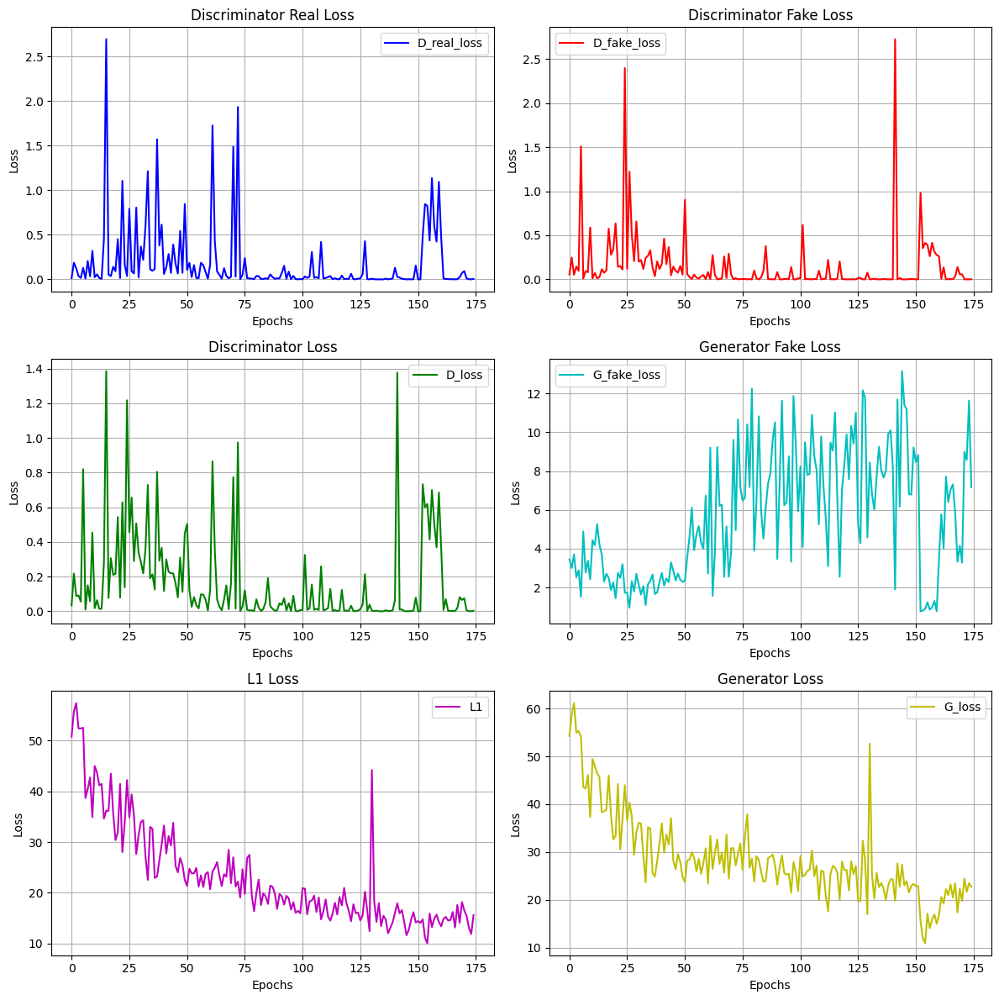

In [38]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

def plot_loss_curve_grid(results: dict[str, list[float]]) -> None:

    D_real_loss = results['D_real_loss']
    D_fake_loss = results['D_fake_loss']
    D_loss = results['D_loss']
    
    G_fake_loss = results['G_fake_loss']
    L1 = results['L1']
    G_loss = results['G_loss']

    epochs = range(len(D_real_loss))

    fig = plt.figure(figsize=(12, 12))
    gs = GridSpec(3, 2, figure=fig)

    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(epochs, D_real_loss,  color='b', label='D_real_loss')
    ax1.set_title('Discriminator Real Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(epochs, D_fake_loss, color='r', label='D_fake_loss')
    ax2.set_title('Discriminator Fake Loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    ax3 = fig.add_subplot(gs[1, 0])
    ax3.plot(epochs, D_loss, color='g', label='D_loss')
    ax3.set_title('Discriminator Loss')
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('Loss')
    ax3.legend()
    ax3.grid(True)

    ax4 = fig.add_subplot(gs[1, 1])
    ax4.plot(epochs, G_fake_loss,  color='c', label='G_fake_loss')
    ax4.set_title('Generator Fake Loss')
    ax4.set_xlabel('Epochs')
    ax4.set_ylabel('Loss')
    ax4.legend()
    ax4.grid(True)

    ax5 = fig.add_subplot(gs[2, 0])
    ax5.plot(epochs, L1, color='m', label='L1')
    ax5.set_title('L1 Loss')
    ax5.set_xlabel('Epochs')
    ax5.set_ylabel('Loss')
    ax5.legend()
    ax5.grid(True)

    ax6 = fig.add_subplot(gs[2, 1])
    ax6.plot(epochs, G_loss, color='y', label='G_loss')
    ax6.set_title('Generator Loss')
    ax6.set_xlabel('Epochs')
    ax6.set_ylabel('Loss')
    ax6.legend()
    ax6.grid(True)

    plt.tight_layout()
    plt.show()
plot_loss_curve_grid(model_history)

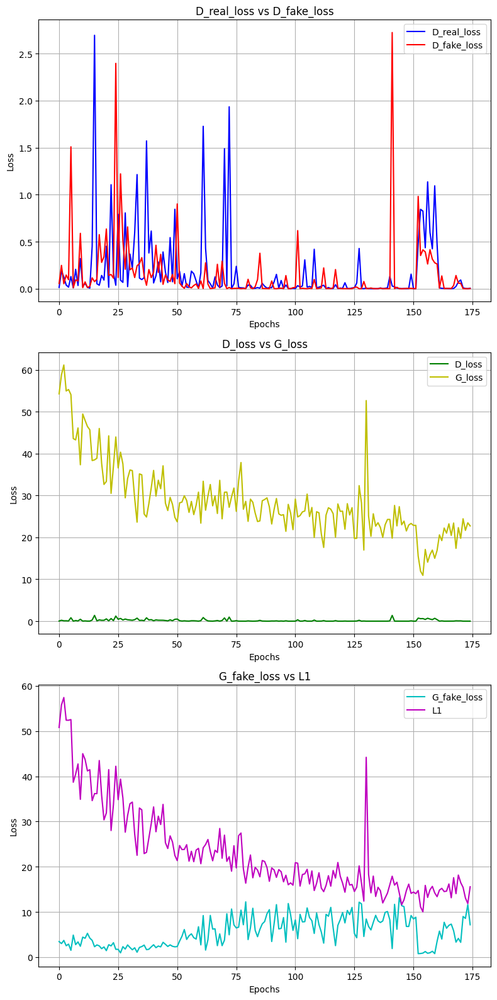

In [42]:
import matplotlib.pyplot as plt

def plot_loss_curves(results: dict[str, list[float]]) -> None:

    D_real_loss = results['D_real_loss']
    D_fake_loss = results['D_fake_loss']
    D_loss = results['D_loss']
    
    G_fake_loss = results['G_fake_loss']
    L1 = results['L1']
    G_loss = results['G_loss']
    
    epochs = range(len(D_real_loss))

    plt.figure(figsize=(8, 16))

    plt.subplot(3, 1, 1)
    plt.plot(epochs, D_real_loss, label='D_real_loss', color='b')
    plt.plot(epochs, D_fake_loss, label='D_fake_loss', color='r')
    plt.title('D_real_loss vs D_fake_loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(3, 1, 2)
    plt.plot(epochs, D_loss, label='D_loss', color='g')
    plt.plot(epochs, G_loss, label='G_loss', color='y')
    plt.title('D_loss vs G_loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(3, 1, 3)
    plt.plot(epochs, G_fake_loss, label='G_fake_loss', color='c')
    plt.plot(epochs, L1, label='L1', color='m')
    plt.title('G_fake_loss vs L1')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
plot_loss_curves(model_history)

## 9. Displaying Generated Images

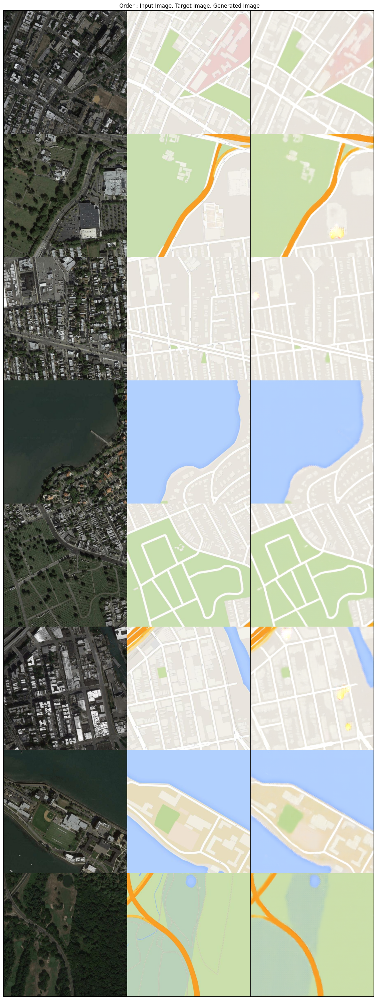

In [12]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open("generated maps/generated-images-0079.png")
plt.figure(figsize=(20,40))
plt.imshow(img)
plt.axis(False) 
plt.title(" Order : Input Image, Target Image, Generated Image")
plt.show()